<a href="https://colab.research.google.com/github/Lewys-Tech/python-for-data-analysis/blob/data/Parkinson's_Disease_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

PARKINSON'S DISEASE PREDICTION MODEL


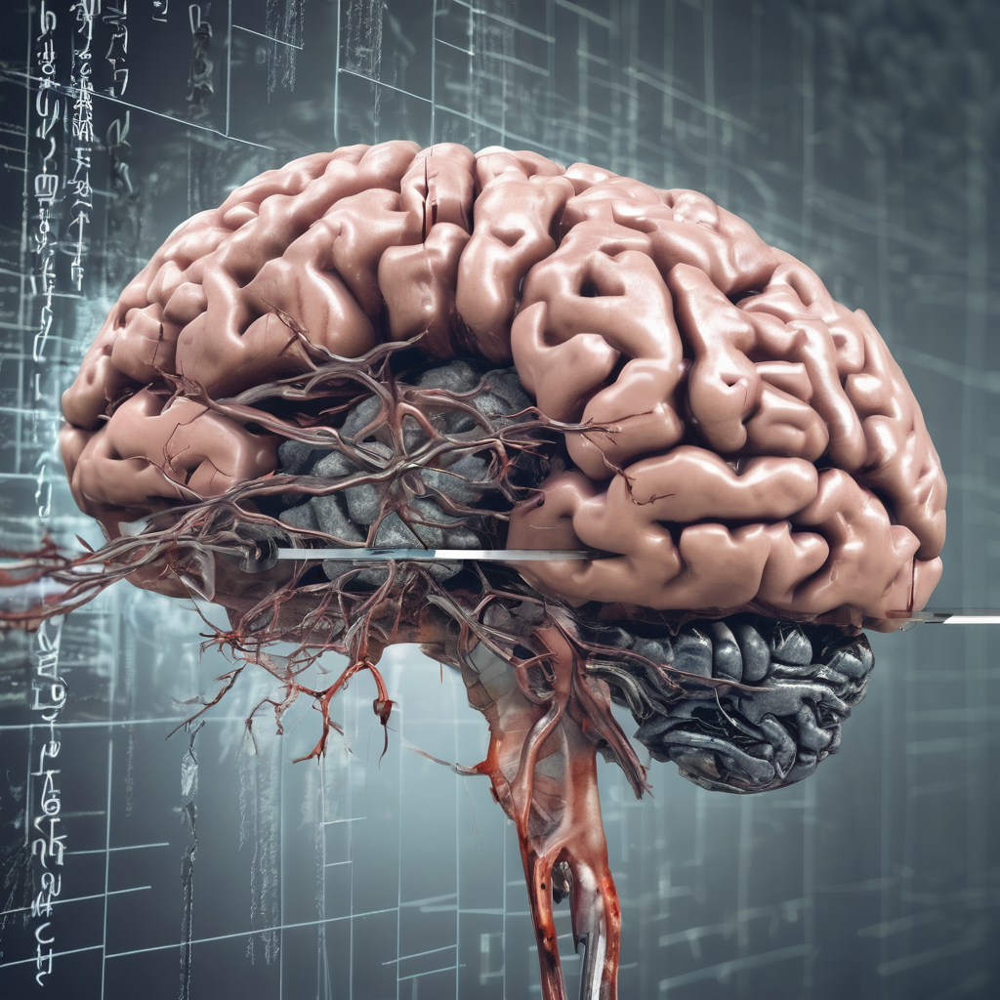

Data source

Kaggle

 Table of Content
* Introduction
* Objective
* Dataset Description
* Data Exploratory
* Oversampling
* Machine Learning Models
* Model Evaluation
* Building a Predictive System
* Best Model Determined
* References

Objective

Develop a predictive model for Parkinson's disease utilizing machine learning algorithms and comprehensive datasets to accurately identify potential risk factors and early indicators, enabling proactive interventions and personalized healthcare management.

Attribute Information:
Matrix column entries (attributes):
name - ASCII subject name and recording number
MDVP:Fo(Hz) - Average vocal fundamental frequency
MDVP:Fhi(Hz) - Maximum vocal fundamental frequency
MDVP:Flo(Hz) - Minimum vocal fundamental frequency
MDVP:Jitter(%), MDVP:Jitter(Abs), MDVP:RAP, MDVP:PPQ, Jitter:DDP - Several measures of variation in fundamental frequency
MDVP:Shimmer,MDVP:Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,MDVP:APQ,Shimmer:DDA - Several measures of variation in amplitude
NHR, HNR - Two measures of the ratio of noise to tonal components in the voice
status - The health status of the subject (one) - Parkinson's, (zero) - healthy
RPDE, D2 - Two nonlinear dynamical complexity measures
DFA - Signal fractal scaling exponent
spread1,spread2,PPE - Three nonlinear measures of fundamental frequency variation

https://colab.research.google.com/drive/1r_8p9nOWWXvc2zJs40txfrUs6M2ur7e2?usp=sharing

Importing Libraries

In [1]:
import json
import re
import warnings
warnings.filterwarnings("ignore", message="use_inf_as_na option is deprecated", category=FutureWarning)

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly
import plotly.graph_objects as go
import plotly.offline as pyo
from plotly.offline import iplot

# from matplotlib.ticker import FuncFormatter

from sklearn.preprocessing import StandardScaler
from sklearn import model_selection
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score, roc_curve


from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB

from mlxtend.classifier import StackingCVClassifier
from xgboost import XGBClassifier


sns.set(context= "notebook", color_codes=True)
plt.style.use('bmh')

pyo.init_notebook_mode()

%matplotlib inline
pd.set_option('display.max_columns', None)

loading the data

In [2]:
df= pd.read_csv('/content/parkinson_Disease.csv')

Data Exploration

In [3]:
#checking the first 5 columns of the data
df.head()

,id,gender,PPE,EEG,RPDE,numPulses,numPeriodsPulses,meanPeriodPulses,stdDevPeriodPulses,locPctJitter,locAbsJitter,rapJitter,ppq5Jitter,ddpJitter,locShimmer,locDbShimmer,apq3Shimmer,apq5Shimmer,apq11Shimmer,ddaShimmer,meanAutoCorrHarmonicity,meanNoiseToHarmHarmonicity,meanHarmToNoiseHarmonicity,minIntensity,maxIntensity,meanIntensity,f1,f2,f3,f4,b1,b2,b3,b4,GQ_prc5_95,GQ_std_cycle_open,GQ_std_cycle_closed,GNE_mean,GNE_std,GNE_SNR_TKEO,GNE_SNR_SEO,GNE_NSR_TKEO,GNE_NSR_SEO,VFER_mean,VFER_std,VFER_entropy,VFER_SNR_TKEO,VFER_SNR_SEO,VFER_NSR_TKEO,VFER_NSR_SEO,IMF_SNR_SEO,IMF_SNR_TKEO,IMF_SNR_entropy,IMF_NSR_SEO,IMF_NSR_TKEO,IMF_NSR_entropy,mean_Log_energy,mean_MFCC_0th_coef,mean_MFCC_1st_coef,mean_MFCC_2nd_coef,mean_MFCC_3rd_coef,mean_MFCC_4th_coef,mean_MFCC_5th_coef,mean_MFCC_6th_coef,mean_MFCC_7th_coef,mean_MFCC_8th_coef,mean_MFCC_9th_coef,mean_MFCC_10th_coef,mean_MFCC_11th_coef,mean_MFCC_12th_coef,mean_delta_log_energy,mean_0th_delta,mean_1st_delta,mean_2nd_delta,mean_3rd_delta,mean_4th_delta,mean_5th_delta,mean_6th_delta,mean_7th_delta,mean_8th_delta,mean_9th_delta,mean_10th_delta,mean_11th_delta,mean_12th_delta,mean_delta_delta_log_energy,mean_delta_delta_0th,mean_1st_delta_delta,mean_2nd_delta_delta,mean_3rd_delta_delta,mean_4th_delta_delta,mean_5th_delta_delta,mean_6th_delta_delta,mean_7th_delta_delta,mean_8th_delta_delta,mean_9th_delta_delta,mean_10th_delta_delta,mean_11th_delta_delta,mean_12th_delta_delta,std_Log_energy,std_MFCC_0th_coef,std_MFCC_1st_coef,std_MFCC_2nd_coef,std_MFCC_3rd_coef,std_MFCC_4th_coef,std_MFCC_5th_coef,std_MFCC_6th_coef,std_MFCC_7th_coef,std_MFCC_8th_coef,std_MFCC_9th_coef,std_MFCC_10th_coef,std_MFCC_11th_coef,std_MFCC_12th_coef,std_delta_log_energy,std_0th_delta,std_1st_delta,std_2nd_delta,std_3rd_delta,std_4th_delta,std_5th_delta,std_6th_delta,std_7th_delta,std_8th_delta,std_9th_delta,std_10th_delta,std_11th_delta,std_12th_delta,std_delta_delta_log_energy,std_delta_delta_0th,std_1st_delta_delta,std_2nd_delta_delta,std_3rd_delta_delta,std_4th_delta_delta,std_5th_delta_delta,std_6th_delta_delta,std_7th_delta_delta,std_8th_delta_delta,std_9th_delta_delta,std_10th_delta_delta,std_11th_delta_delta,std_12th_delta_delta,Ea,Ed_1_coef,Ed_2_coef,Ed_3_coef,Ed_4_coef,Ed_5_coef,Ed_6_coef,Ed_7_coef,Ed_8_coef,Ed_9_coef,Ed_10_coef,det_entropy_shannon_1_coef,det_entropy_shannon_2_coef,det_entropy_shannon_3_coef,det_entropy_shannon_4_coef,det_entropy_shannon_5_coef,det_entropy_shannon_6_coef,det_entropy_shannon_7_coef,det_entropy_shannon_8_coef,det_entropy_shannon_9_coef,det_entropy_shannon_10_coef,det_entropy_log_1_coef,det_entropy_log_2_coef,det_entropy_log_3_coef,det_entropy_log_4_coef,det_entropy_log_5_coef,det_entropy_log_6_coef,det_entropy_log_7_coef,det_entropy_log_8_coef,det_entropy_log_9_coef,det_entropy_log_10_coef,det_TKEO_mean_1_coef,det_TKEO_mean_2_coef,det_TKEO_mean_3_coef,det_TKEO_mean_4_coef,det_TKEO_mean_5_coef,det_TKEO_mean_6_coef,det_TKEO_mean_7_coef,det_TKEO_mean_8_coef,det_TKEO_mean_9_coef,det_TKEO_mean_10_coef,det_TKEO_std_1_coef,det_TKEO_std_2_coef,det_TKEO_std_3_coef,det_TKEO_std_4_coef,det_TKEO_std_5_coef,det_TKEO_std_6_coef,det_TKEO_std_7_coef,det_TKEO_std_8_coef,det_TKEO_std_9_coef,det_TKEO_std_10_coef,app_entropy_shannon_1_coef,app_entropy_shannon_2_coef,app_entropy_shannon_3_coef,app_entropy_shannon_4_coef,app_entropy_shannon_5_coef,app_entropy_shannon_6_coef,app_entropy_shannon_7_coef,app_entropy_shannon_8_coef,app_entropy_shannon_9_coef,app_entropy_shannon_10_coef,app_entropy_log_1_coef,app_entropy_log_2_coef,app_entropy_log_3_coef,app_entropy_log_4_coef,app_entropy_log_5_coef,app_entropy_log_6_coef,app_entropy_log_7_coef,app_entropy_log_8_coef,app_entropy_log_9_coef,app_entropy_log_10_coef,app_det_TKEO_mean_1_coef,app_det_TKEO_mean_2_coef,app_det_TKEO_mean_3_coef,app_det_TKEO_mean_4_coef,app_det_TKEO_mean_5_coef,app_det_TKEO_mean_6_coef,app_det_TKEO_mean_7_coef,app_det_TKEO_mean_8_coef,app_det_TKEO_mean_9_coef,app_det_TKEO_mean_10_coef,app_TKEO_std_1_coef,app_TKEO_std_2_coef,app_TKEO_

In [4]:
#Checking the column names
df.columns

Index(['id', 'gender', 'PPE', 'EEG', 'RPDE', 'numPulses', 'numPeriodsPulses',
       'meanPeriodPulses', 'stdDevPeriodPulses', 'locPctJitter',
       ...
       'tqwt_kurtosisValue_dec_28', 'tqwt_kurtosisValue_dec_29',
       'tqwt_kurtosisValue_dec_30', 'tqwt_kurtosisValue_dec_31',
       'tqwt_kurtosisValue_dec_32', 'tqwt_kurtosisValue_dec_33',
       'tqwt_kurtosisValue_dec_34', 'tqwt_kurtosisValue_dec_35',
       'tqwt_kurtosisValue_dec_36', 'class'],
      dtype='object', length=755)

In [5]:
#Determine the non null count and data types
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 448 entries, 0 to 447
Columns: 755 entries, id to class
dtypes: float64(751), int64(4)
memory usage: 2.6 MB


In [6]:
#Determine the no of rows and columns in the dataframe
df.shape

(448, 755)

In [7]:
#checking for missing value in each column
df.isnull().sum()

id                           0
gender                       0
PPE                          0
EEG                          0
RPDE                         0
                            ..
tqwt_kurtosisValue_dec_33    1
tqwt_kurtosisValue_dec_34    1
tqwt_kurtosisValue_dec_35    1
tqwt_kurtosisValue_dec_36    1
class                        1
Length: 755, dtype: int64

In [8]:
df.isna().sum()

id                           0
gender                       0
PPE                          0
EEG                          0
RPDE                         0
                            ..
tqwt_kurtosisValue_dec_33    1
tqwt_kurtosisValue_dec_34    1
tqwt_kurtosisValue_dec_35    1
tqwt_kurtosisValue_dec_36    1
class                        1
Length: 755, dtype: int64

Outcome: There is no missing or null values in the dataset

In [9]:
#Determine whether there were duplicate rows
df.duplicated().sum()

1

Outcome: There is one duplicated row
solution: Lets drop it

In [10]:
#Droping the duplicated row
df=df.drop_duplicates()
df

id  gender      PPE      EEG     RPDE  numPulses  numPeriodsPulses  \
0      0       1  0.85247  0.71826  0.57227        240               239   
1      0       1  0.76686  0.69481  0.53966        234               233   
2      0       1  0.85083  0.67604  0.58982        232               231   
3      1       0  0.41121  0.79672  0.59257        178               177   
4      1       0  0.32790  0.79782  0.53028        236               235   
..   ...     ...      ...      ...      ...        ...               ...   
443  147       0  0.86301  0.66940  0.24177        564               563   
444  148       0  0.22366  0.68930  0.49566        304               302   
445  148       0  0.75864  0.70115  0.48075        337               336   
446  148       0  0.78118  0.69000  0.48311        340               339   
447  149       0  0.85044  0.57761  0.26036        551               550   

     meanPeriodPulses  stdDevPeriodPulses  locPctJitter  locAbsJitter  \
0            0.008064            0.000087       0.00218      0.000018   
1            0.008258            0.000073       0.00195      0.000016   
2            0.008340            0.000060       0.00176      0.000015   
3            0.010858            0.000183       0.00419      0.000046   
4            0.008162            0.002669       0.00535      0.000044   
..                ...                 ...           ...           ...   
443          0.003421            0.000026       0.00057      0.000002   
444          0.006339            0.001706       0.00247      0.000016   
445          0.005728            0.000892       0.00358      0.000021   
446          0.005674            0.000083       0.00141      0.000008   
447          0.003500            0.000026       0.00046      0.000002   

     rapJitter  ppq5Jitter  ddpJitter  locShimmer  locDbShimmer  apq3Shimmer  \
0      0.00067     0.00129    0.00200     0.05883         0.517      0.03011   
1      0.00052     0.00112    0.00157     0.05516         0.502      0.02320   
2      0.00057     0.00111    0.00171     0.09902         0.897      0.05094   
3      0.00149     0.00268    0.00446     0.05451         0.527      0.02395   
4      0.00166     0.00227    0.00499     0.05610         0.497      0.02909   
..         ...         ...        ...         ...           ...          ...   
443    0.00006     0.00016    0.00017     0.04217         0.383      0.02306   
444    0.00065     0.00092    0.00195     0.03636         0.328      0.01824   
445    0.00081     0.00084    0.00243     0.04612         0.422      0.02308   
446    0.00019     0.00046    0.00056     0.04125         0.375      0.02475   
447    0.00003     0.00009    0.00010     0.01110         0.097      0.00566   

     apq5Shimmer  apq11Shimmer  ddaShimmer  meanAutoCorrHarmonicity  \
0        0.03496       0.04828     0.09034                 0.970805   
1        0.03675       0.06195     0.06961                 0.984322   
2        0.06497       0.07772     0.15282                 0.974846   
3        0.02857       0.04462     0.07185                 0.968343   
4        0.03327       0.05278     0.08728                 0.975754   
..           ...           ...         ...                      ...   
443      0.02567       0.03342     0.06917                 0.994857   
444      0.02030       0.02862     0.05471                 0.986100   
445      0.02471       0.03284     0.06923                 0.988263   
446      0.01866       0.02875     0.07426                 0.991795   
447      0.00686       0.00882     0.01697                 0.998262   

     meanNoiseToHarmHarmonicity  meanHarmToNoiseHarmonicity  minIntensity  \
0                      0.036223                      18.995     69.997496   
1                      0.017974                      21.497     67.415903   
2                      0.026313                      17.651     62.661706   
3                      0.042003                      19.865     76.306989   
4                

In [11]:
#confirm whether the duplicated row is dropped
df.duplicated().sum()

0

Outcome:duplicated row dropped successfully

In [12]:
#Getting some stastical measures about the data
df.describe()

,id,gender,PPE,EEG,RPDE,numPulses,numPeriodsPulses,meanPeriodPulses,stdDevPeriodPulses,locPctJitter,locAbsJitter,rapJitter,ppq5Jitter,ddpJitter,locShimmer,locDbShimmer,apq3Shimmer,apq5Shimmer,apq11Shimmer,ddaShimmer,meanAutoCorrHarmonicity,meanNoiseToHarmHarmonicity,meanHarmToNoiseHarmonicity,minIntensity,maxIntensity,meanIntensity,f1,f2,f3,f4,b1,b2,b3,b4,GQ_prc5_95,GQ_std_cycle_open,GQ_std_cycle_closed,GNE_mean,GNE_std,GNE_SNR_TKEO,GNE_SNR_SEO,GNE_NSR_TKEO,GNE_NSR_SEO,VFER_mean,VFER_std,VFER_entropy,VFER_SNR_TKEO,VFER_SNR_SEO,VFER_NSR_TKEO,VFER_NSR_SEO,IMF_SNR_SEO,IMF_SNR_TKEO,IMF_SNR_entropy,IMF_NSR_SEO,IMF_NSR_TKEO,IMF_NSR_entropy,mean_Log_energy,mean_MFCC_0th_coef,mean_MFCC_1st_coef,mean_MFCC_2nd_coef,mean_MFCC_3rd_coef,mean_MFCC_4th_coef,mean_MFCC_5th_coef,mean_MFCC_6th_coef,mean_MFCC_7th_coef,mean_MFCC_8th_coef,mean_MFCC_9th_coef,mean_MFCC_10th_coef,mean_MFCC_11th_coef,mean_MFCC_12th_coef,mean_delta_log_energy,mean_0th_delta,mean_1st_delta,mean_2nd_delta,mean_3rd_delta,mean_4th_delta,mean_5th_delta,mean_6th_delta,mean_7th_delta,mean_8th_delta,mean_9th_delta,mean_10th_delta,mean_11th_delta,mean_12th_delta,mean_delta_delta_log_energy,mean_delta_delta_0th,mean_1st_delta_delta,mean_2nd_delta_delta,mean_3rd_delta_delta,mean_4th_delta_delta,mean_5th_delta_delta,mean_6th_delta_delta,mean_7th_delta_delta,mean_8th_delta_delta,mean_9th_delta_delta,mean_10th_delta_delta,mean_11th_delta_delta,mean_12th_delta_delta,std_Log_energy,std_MFCC_0th_coef,std_MFCC_1st_coef,std_MFCC_2nd_coef,std_MFCC_3rd_coef,std_MFCC_4th_coef,std_MFCC_5th_coef,std_MFCC_6th_coef,std_MFCC_7th_coef,std_MFCC_8th_coef,std_MFCC_9th_coef,std_MFCC_10th_coef,std_MFCC_11th_coef,std_MFCC_12th_coef,std_delta_log_energy,std_0th_delta,std_1st_delta,std_2nd_delta,std_3rd_delta,std_4th_delta,std_5th_delta,std_6th_delta,std_7th_delta,std_8th_delta,std_9th_delta,std_10th_delta,std_11th_delta,std_12th_delta,std_delta_delta_log_energy,std_delta_delta_0th,std_1st_delta_delta,std_2nd_delta_delta,std_3rd_delta_delta,std_4th_delta_delta,std_5th_delta_delta,std_6th_delta_delta,std_7th_delta_delta,std_8th_delta_delta,std_9th_delta_delta,std_10th_delta_delta,std_11th_delta_delta,std_12th_delta_delta,Ea,Ed_1_coef,Ed_2_coef,Ed_3_coef,Ed_4_coef,Ed_5_coef,Ed_6_coef,Ed_7_coef,Ed_8_coef,Ed_9_coef,Ed_10_coef,det_entropy_shannon_1_coef,det_entropy_shannon_2_coef,det_entropy_shannon_3_coef,det_entropy_shannon_4_coef,det_entropy_shannon_5_coef,det_entropy_shannon_6_coef,det_entropy_shannon_7_coef,det_entropy_shannon_8_coef,det_entropy_shannon_9_coef,det_entropy_shannon_10_coef,det_entropy_log_1_coef,det_entropy_log_2_coef,det_entropy_log_3_coef,det_entropy_log_4_coef,det_entropy_log_5_coef,det_entropy_log_6_coef,det_entropy_log_7_coef,det_entropy_log_8_coef,det_entropy_log_9_coef,det_entropy_log_10_coef,det_TKEO_mean_1_coef,det_TKEO_mean_2_coef,det_TKEO_mean_3_coef,det_TKEO_mean_4_coef,det_TKEO_mean_5_coef,det_TKEO_mean_6_coef,det_TKEO_mean_7_coef,det_TKEO_mean_8_coef,det_TKEO_mean_9_coef,det_TKEO_mean_10_coef,det_TKEO_std_1_coef,det_TKEO_std_2_coef,det_TKEO_std_3_coef,det_TKEO_std_4_coef,det_TKEO_std_5_coef,det_TKEO_std_6_coef,det_TKEO_std_7_coef,det_TKEO_std_8_coef,det_TKEO_std_9_coef,det_TKEO_std_10_coef,app_entropy_shannon_1_coef,app_entropy_shannon_2_coef,app_entropy_shannon_3_coef,app_entropy_shannon_4_coef,app_entropy_shannon_5_coef,app_entropy_shannon_6_coef,app_entropy_shannon_7_coef,app_entropy_shannon_8_coef,app_entropy_shannon_9_coef,app_entropy_shannon_10_coef,app_entropy_log_1_coef,app_entropy_log_2_coef,app_entropy_log_3_coef,app_entropy_log_4_coef,app_entropy_log_5_coef,app_entropy_log_6_coef,app_entropy_log_7_coef,app_entropy_log_8_coef,app_entropy_log_9_coef,app_entropy_log_10_coef,app_det_TKEO_mean_1_coef,app_det_TKEO_mean_2_coef,app_det_TKEO_mean_3_coef,app_det_TKEO_mean_4_coef,app_det_TKEO_mean_5_coef,app_det_TKEO_mean_6_coef,app_det_TKEO_mean_7_coef,app_det_TKEO_mean_8_coef,app_det_TKEO_mean_9_coef,app_det_TKEO_mean_10_coef,app_TKEO_std_1_coef,app_TKEO_std_2_coef,app_TKEO_

In [13]:
df.dtypes

id                             int64
gender                         int64
PPE                          float64
EEG                          float64
RPDE                         float64
                              ...   
tqwt_kurtosisValue_dec_33    float64
tqwt_kurtosisValue_dec_34    float64
tqwt_kurtosisValue_dec_35    float64
tqwt_kurtosisValue_dec_36    float64
class                        float64
Length: 755, dtype: object

Determine the correlation of the numeric Fields

In [14]:
# # selecting only numeric columns for correlation calculation
# numeric_df =df.select_dtypes(include=['float64', 'int64'])

# plt.figure(figsize=(20,20))
# sns.heatmap(numeric_df.corr(), fmt='.2f', annot=True)
# plt.show()

Univariant and Bivariant analysis


In [15]:
df_summary=df.describe()
df_summary

,id,gender,PPE,EEG,RPDE,numPulses,numPeriodsPulses,meanPeriodPulses,stdDevPeriodPulses,locPctJitter,locAbsJitter,rapJitter,ppq5Jitter,ddpJitter,locShimmer,locDbShimmer,apq3Shimmer,apq5Shimmer,apq11Shimmer,ddaShimmer,meanAutoCorrHarmonicity,meanNoiseToHarmHarmonicity,meanHarmToNoiseHarmonicity,minIntensity,maxIntensity,meanIntensity,f1,f2,f3,f4,b1,b2,b3,b4,GQ_prc5_95,GQ_std_cycle_open,GQ_std_cycle_closed,GNE_mean,GNE_std,GNE_SNR_TKEO,GNE_SNR_SEO,GNE_NSR_TKEO,GNE_NSR_SEO,VFER_mean,VFER_std,VFER_entropy,VFER_SNR_TKEO,VFER_SNR_SEO,VFER_NSR_TKEO,VFER_NSR_SEO,IMF_SNR_SEO,IMF_SNR_TKEO,IMF_SNR_entropy,IMF_NSR_SEO,IMF_NSR_TKEO,IMF_NSR_entropy,mean_Log_energy,mean_MFCC_0th_coef,mean_MFCC_1st_coef,mean_MFCC_2nd_coef,mean_MFCC_3rd_coef,mean_MFCC_4th_coef,mean_MFCC_5th_coef,mean_MFCC_6th_coef,mean_MFCC_7th_coef,mean_MFCC_8th_coef,mean_MFCC_9th_coef,mean_MFCC_10th_coef,mean_MFCC_11th_coef,mean_MFCC_12th_coef,mean_delta_log_energy,mean_0th_delta,mean_1st_delta,mean_2nd_delta,mean_3rd_delta,mean_4th_delta,mean_5th_delta,mean_6th_delta,mean_7th_delta,mean_8th_delta,mean_9th_delta,mean_10th_delta,mean_11th_delta,mean_12th_delta,mean_delta_delta_log_energy,mean_delta_delta_0th,mean_1st_delta_delta,mean_2nd_delta_delta,mean_3rd_delta_delta,mean_4th_delta_delta,mean_5th_delta_delta,mean_6th_delta_delta,mean_7th_delta_delta,mean_8th_delta_delta,mean_9th_delta_delta,mean_10th_delta_delta,mean_11th_delta_delta,mean_12th_delta_delta,std_Log_energy,std_MFCC_0th_coef,std_MFCC_1st_coef,std_MFCC_2nd_coef,std_MFCC_3rd_coef,std_MFCC_4th_coef,std_MFCC_5th_coef,std_MFCC_6th_coef,std_MFCC_7th_coef,std_MFCC_8th_coef,std_MFCC_9th_coef,std_MFCC_10th_coef,std_MFCC_11th_coef,std_MFCC_12th_coef,std_delta_log_energy,std_0th_delta,std_1st_delta,std_2nd_delta,std_3rd_delta,std_4th_delta,std_5th_delta,std_6th_delta,std_7th_delta,std_8th_delta,std_9th_delta,std_10th_delta,std_11th_delta,std_12th_delta,std_delta_delta_log_energy,std_delta_delta_0th,std_1st_delta_delta,std_2nd_delta_delta,std_3rd_delta_delta,std_4th_delta_delta,std_5th_delta_delta,std_6th_delta_delta,std_7th_delta_delta,std_8th_delta_delta,std_9th_delta_delta,std_10th_delta_delta,std_11th_delta_delta,std_12th_delta_delta,Ea,Ed_1_coef,Ed_2_coef,Ed_3_coef,Ed_4_coef,Ed_5_coef,Ed_6_coef,Ed_7_coef,Ed_8_coef,Ed_9_coef,Ed_10_coef,det_entropy_shannon_1_coef,det_entropy_shannon_2_coef,det_entropy_shannon_3_coef,det_entropy_shannon_4_coef,det_entropy_shannon_5_coef,det_entropy_shannon_6_coef,det_entropy_shannon_7_coef,det_entropy_shannon_8_coef,det_entropy_shannon_9_coef,det_entropy_shannon_10_coef,det_entropy_log_1_coef,det_entropy_log_2_coef,det_entropy_log_3_coef,det_entropy_log_4_coef,det_entropy_log_5_coef,det_entropy_log_6_coef,det_entropy_log_7_coef,det_entropy_log_8_coef,det_entropy_log_9_coef,det_entropy_log_10_coef,det_TKEO_mean_1_coef,det_TKEO_mean_2_coef,det_TKEO_mean_3_coef,det_TKEO_mean_4_coef,det_TKEO_mean_5_coef,det_TKEO_mean_6_coef,det_TKEO_mean_7_coef,det_TKEO_mean_8_coef,det_TKEO_mean_9_coef,det_TKEO_mean_10_coef,det_TKEO_std_1_coef,det_TKEO_std_2_coef,det_TKEO_std_3_coef,det_TKEO_std_4_coef,det_TKEO_std_5_coef,det_TKEO_std_6_coef,det_TKEO_std_7_coef,det_TKEO_std_8_coef,det_TKEO_std_9_coef,det_TKEO_std_10_coef,app_entropy_shannon_1_coef,app_entropy_shannon_2_coef,app_entropy_shannon_3_coef,app_entropy_shannon_4_coef,app_entropy_shannon_5_coef,app_entropy_shannon_6_coef,app_entropy_shannon_7_coef,app_entropy_shannon_8_coef,app_entropy_shannon_9_coef,app_entropy_shannon_10_coef,app_entropy_log_1_coef,app_entropy_log_2_coef,app_entropy_log_3_coef,app_entropy_log_4_coef,app_entropy_log_5_coef,app_entropy_log_6_coef,app_entropy_log_7_coef,app_entropy_log_8_coef,app_entropy_log_9_coef,app_entropy_log_10_coef,app_det_TKEO_mean_1_coef,app_det_TKEO_mean_2_coef,app_det_TKEO_mean_3_coef,app_det_TKEO_mean_4_coef,app_det_TKEO_mean_5_coef,app_det_TKEO_mean_6_coef,app_det_TKEO_mean_7_coef,app_det_TKEO_mean_8_coef,app_det_TKEO_mean_9_coef,app_det_TKEO_mean_10_coef,app_TKEO_std_1_coef,app_TKEO_std_2_coef,app_TKEO_

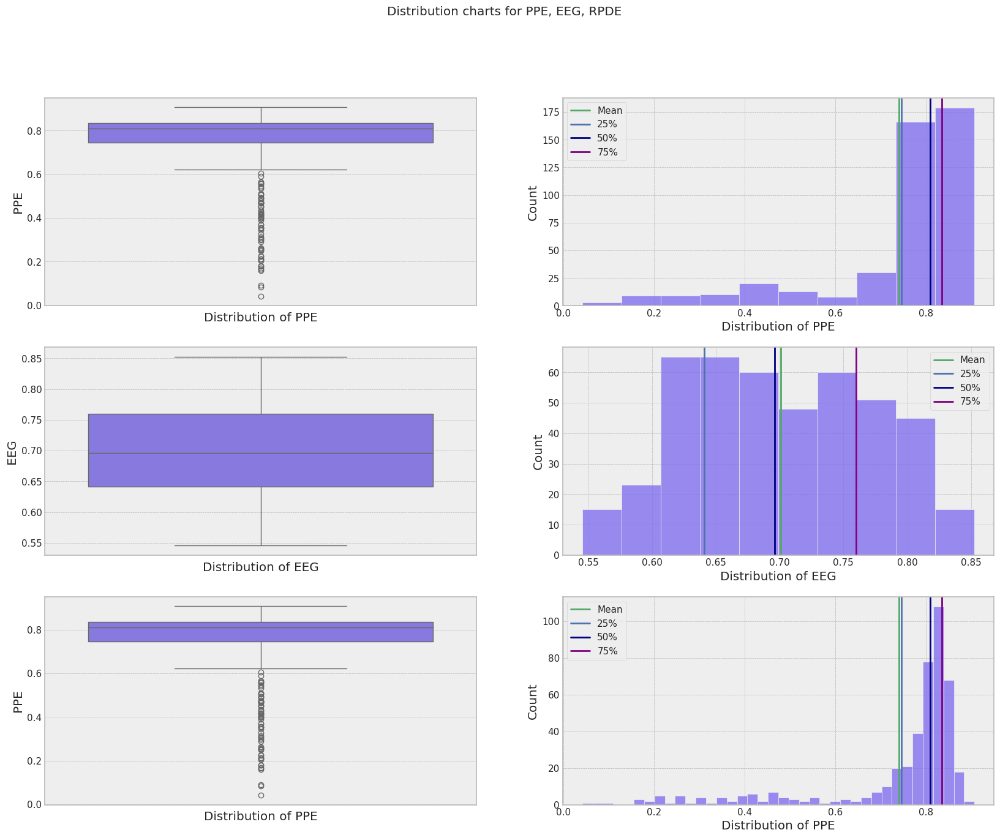

In [49]:
def draw_axvlines(plt, col):
    mean = df_summary.loc["mean", col]
    q1 = df_summary.loc["25%", col]
    q2 = df_summary.loc["50%", col]
    q3 = df_summary.loc["75%", col]
    plt.axvline(mean, color = "g");              # Plotting a line to mark the mean
    plt.axvline(q1, color = "b");                # Plotting a line to mark Q1
    plt.axvline(q2, color = "navy");             # Plotting a line to mark Q2
    plt.axvline(q3, color = "purple");           # Plotting a line to mark Q3
    plt.legend({"Mean": mean, "25%" : q1, "50%" : q2, "75%" : q3})

fig, axes = plt.subplots(3, 2, figsize = (20,15))
fig.suptitle('Distribution charts for PPE, EEG, RPDE')
# Create boxplot to show distribution of Age
sns.boxplot(df["PPE"], ax = axes[0][0], color = "mediumslateblue")
axes[0][0].set(xlabel = 'Distribution of PPE')

pp = sns.histplot(df["PPE"], ax = axes[0][1], bins = 10, color = "mediumslateblue")
axes[0][1].set(xlabel = 'Distribution of PPE')
draw_axvlines(pp, "PPE")

# Create boxplot to show distribution of creatinine_phosphokinase
sns.boxplot(df["EEG"], ax = axes[1][0], color = "mediumslateblue")
axes[1][0].set(xlabel = 'Distribution of EEG')

pp = sns.histplot(df["EEG"], ax = axes[1][1], bins = 10, color = "mediumslateblue")
axes[1][1].set(xlabel = 'Distribution of EEG')
draw_axvlines(pp, "EEG")


# Create boxplot to show distribution of platelets
sns.boxplot(df["PPE"], ax = axes[2][0], color = "mediumslateblue")
axes[2][0].set(xlabel = 'Distribution of PPE')

pp = sns.histplot(df["PPE"], ax = axes[2][1], color = "mediumslateblue")
axes[2][1].set(xlabel = 'Distribution of PPE')
draw_axvlines(pp, "PPE")
plt.show()





In [17]:
df['class'].unique()

array([ 1.,  0., nan])

<Axes: xlabel='PPE', ylabel='locPctJitter'>

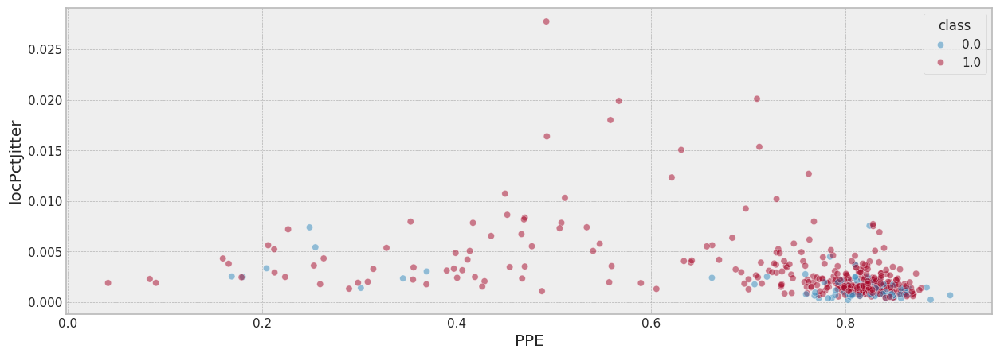

In [18]:
plt.figure(figsize = (15, 5))
sns.scatterplot(x = "PPE", y = "locPctJitter", data = df[["PPE", "locPctJitter", "class"]], hue = "class", alpha = 0.5)

The plot indicates that individuals without Parkinson's disease generally exhibit lower fundamental frequency and typically have jitter percentages below 0.005%.

In [50]:
# distribution of target Variable
df['class'].value_counts()

class
1.0    350
0.0     96
Name: count, dtype: int64

There are 350 data for Parkinson's Positive and only 96 for Healthy, this shows that the dataset is imbalanced.

BALANCING THE DATA

1 --> Parkinson's Positive

0 --> Healthy

In [20]:
#Assign the result of value counts to two variables
status_count_1, status_count_0 = df['class'].value_counts()

print(status_count_1)
print(status_count_0)

350
96


In [21]:
# Creating two separate DataFrames for different classes of the 'class' variable
status_1 = df[df['class']==1]
status_0 = df[df['class']==0]

print(status_1)
print(status_0)

Streaming output truncated to the last 5000 lines.
442              0.016027              0.026675              0.018420   
443              0.010897              0.012235              0.009781   
444              0.084702              0.068413              0.070433   
445              0.089797              0.061676              0.089429   
446              0.084203              0.056129              0.080296   

     tqwt_TKEO_std_dec_23  tqwt_TKEO_std_dec_24  tqwt_TKEO_std_dec_25  \
0                0.080709              0.032363              0.009210   
1                0.020618              0.011377              0.007183   
2                0.004722              0.003986              0.003989   
3                0.171310              0.704870              1.279300   
4                0.121320              0.560380              1.231800   
..                    ...                   ...                   ...   
442              0.007506              0.020684              0.072896   

In [22]:
# Oversample status_0
status_0_over = status_0.sample(status_count_1, replace=True)
status_0_over

id  gender      PPE      EEG     RPDE  numPulses  numPeriodsPulses  \
333  111       1  0.75872  0.63853  0.62918        226               225   
251   83       0  0.80438  0.75680  0.30563        441               440   
377  125       0  0.30152  0.67408  0.38991        371               369   
393  131       0  0.83119  0.56441  0.45199        346               345   
226   75       0  0.18008  0.80006  0.51201        313               312   
..   ...     ...      ...      ...      ...        ...               ...   
235   78       1  0.83537  0.65154  0.36501        237               236   
127   42       1  0.25475  0.63092  0.58637        243               242   
333  111       1  0.75872  0.63853  0.62918        226               225   
236   78       1  0.80997  0.68753  0.55747        237               236   
103   34       0  0.82239  0.66053  0.34074        373               372   

     meanPeriodPulses  stdDevPeriodPulses  locPctJitter  locAbsJitter  \
333          0.008538            0.000110       0.00275      0.000023   
251          0.004376            0.000024       0.00072      0.000003   
377          0.005186            0.001347       0.00139      0.000007   
393          0.005589            0.000102       0.00137      0.000008   
226          0.006151            0.001157       0.00247      0.000015   
..                ...                 ...           ...           ...   
235          0.008144            0.000063       0.00139      0.000011   
127          0.007935            0.002505       0.00541      0.000043   
333          0.008538            0.000110       0.00275      0.000023   
236          0.008012            0.000448       0.00370      0.000030   
103          0.005172            0.000041       0.00141      0.000007   

     rapJitter  ppq5Jitter  ddpJitter  locShimmer  locDbShimmer  apq3Shimmer  \
333    0.00062     0.00149    0.00185     0.03820         0.333      0.01908   
251    0.00011     0.00028    0.00033     0.06930         0.608      0.03697   
377    0.00028     0.00058    0.00083     0.04364         0.383      0.02179   
393    0.00016     0.00042    0.00049     0.04119         0.340      0.02093   
226    0.00074     0.00097    0.00221     0.07272         0.628      0.04092   
..         ...         ...        ...         ...           ...          ...   
235    0.00031     0.00074    0.00093     0.08024         0.711      0.03901   
127    0.00187     0.00212    0.00560     0.05284         0.376      0.02760   
333    0.00062     0.00149    0.00185     0.03820         0.333      0.01908   
236    0.00073     0.00146    0.00218     0.11903         1.067      0.06634   
103    0.00024     0.00062    0.00072     0.05941         0.520      0.03266   

     apq5Shimmer  apq11Shimmer  ddaShimmer  meanAutoCorrHarmonicity  \
333      0.02400       0.03535     0.05725                 0.982489   
251      0.04754       0.05544     0.11090                 0.992264   
377      0.02801       0.02938     0.06538                 0.988346   
393      0.02402       0.03604     0.06279                 0.994086   
226      0.04661       0.05176     0.12275                 0.982929   
..           ...           ...         ...                      ...   
235      0.05318       0.07984     0.11702                 0.991367   
127      0.02398       0.02787     0.08281                 0.930717   
333      0.02400       0.03535     0.05725                 0.982489   
236      0.06684       0.08744     0.19903                 0.947826   
103      0.03623       0.04678     0.09799                 0.985400   

     meanNoiseToHarmHarmonicity  meanHarmToNoiseHarmonicity  minIntensity  \
333                    0.018134                      19.310     72.221228   
251                    0.007809                      21.546     66.976843   
377                    0.012844                      23.627     75.034112   
393                    0.005968                      23.725     76.789147   
226              

In [23]:
# Concatenate status_o_over with status_1
status_balanced = pd.concat([status_0_over, status_1], axis=0)
status_balanced

id  gender      PPE      EEG     RPDE  numPulses  numPeriodsPulses  \
333  111       1  0.75872  0.63853  0.62918        226               225   
251   83       0  0.80438  0.75680  0.30563        441               440   
377  125       0  0.30152  0.67408  0.38991        371               369   
393  131       0  0.83119  0.56441  0.45199        346               345   
226   75       0  0.18008  0.80006  0.51201        313               312   
..   ...     ...      ...      ...      ...        ...               ...   
442  147       0  0.84554  0.62204  0.15430        595               594   
443  147       0  0.86301  0.66940  0.24177        564               563   
444  148       0  0.22366  0.68930  0.49566        304               302   
445  148       0  0.75864  0.70115  0.48075        337               336   
446  148       0  0.78118  0.69000  0.48311        340               339   

     meanPeriodPulses  stdDevPeriodPulses  locPctJitter  locAbsJitter  \
333          0.008538            0.000110       0.00275      0.000023   
251          0.004376            0.000024       0.00072      0.000003   
377          0.005186            0.001347       0.00139      0.000007   
393          0.005589            0.000102       0.00137      0.000008   
226          0.006151            0.001157       0.00247      0.000015   
..                ...                 ...           ...           ...   
442          0.003243            0.000013       0.00050      0.000002   
443          0.003421            0.000026       0.00057      0.000002   
444          0.006339            0.001706       0.00247      0.000016   
445          0.005728            0.000892       0.00358      0.000021   
446          0.005674            0.000083       0.00141      0.000008   

     rapJitter  ppq5Jitter  ddpJitter  locShimmer  locDbShimmer  apq3Shimmer  \
333    0.00062     0.00149    0.00185     0.03820         0.333      0.01908   
251    0.00011     0.00028    0.00033     0.06930         0.608      0.03697   
377    0.00028     0.00058    0.00083     0.04364         0.383      0.02179   
393    0.00016     0.00042    0.00049     0.04119         0.340      0.02093   
226    0.00074     0.00097    0.00221     0.07272         0.628      0.04092   
..         ...         ...        ...         ...           ...          ...   
442    0.00005     0.00015    0.00016     0.04252         0.369      0.02072   
443    0.00006     0.00016    0.00017     0.04217         0.383      0.02306   
444    0.00065     0.00092    0.00195     0.03636         0.328      0.01824   
445    0.00081     0.00084    0.00243     0.04612         0.422      0.02308   
446    0.00019     0.00046    0.00056     0.04125         0.375      0.02475   

     apq5Shimmer  apq11Shimmer  ddaShimmer  meanAutoCorrHarmonicity  \
333      0.02400       0.03535     0.05725                 0.982489   
251      0.04754       0.05544     0.11090                 0.992264   
377      0.02801       0.02938     0.06538                 0.988346   
393      0.02402       0.03604     0.06279                 0.994086   
226      0.04661       0.05176     0.12275                 0.982929   
..           ...           ...         ...                      ...   
442      0.02372       0.03928     0.06217                 0.996851   
443      0.02567       0.03342     0.06917                 0.994857   
444      0.02030       0.02862     0.05471                 0.986100   
445      0.02471       0.03284     0.06923                 0.988263   
446      0.01866       0.02875     0.07426                 0.991795   

     meanNoiseToHarmHarmonicity  meanHarmToNoiseHarmonicity  minIntensity  \
333                    0.018134                      19.310     72.221228   
251                    0.007809                      21.546     66.976843   
377                    0.012844                      23.627     75.034112   
393                    0.005968                      23.725     76.789147   
226              

In [24]:
# Selecting only numeric columns
numeric_status_balanced = status_balanced.select_dtypes(include=['float64', 'int64'])

# Group by 'status' column and calculate mean for each group
mean_by_status = numeric_status_balanced.groupby('class').mean()

# Display the result
mean_by_status

,id,gender,PPE,EEG,RPDE,numPulses,numPeriodsPulses,meanPeriodPulses,stdDevPeriodPulses,locPctJitter,locAbsJitter,rapJitter,ppq5Jitter,ddpJitter,locShimmer,locDbShimmer,apq3Shimmer,apq5Shimmer,apq11Shimmer,ddaShimmer,meanAutoCorrHarmonicity,meanNoiseToHarmHarmonicity,meanHarmToNoiseHarmonicity,minIntensity,maxIntensity,meanIntensity,f1,f2,f3,f4,b1,b2,b3,b4,GQ_prc5_95,GQ_std_cycle_open,GQ_std_cycle_closed,GNE_mean,GNE_std,GNE_SNR_TKEO,GNE_SNR_SEO,GNE_NSR_TKEO,GNE_NSR_SEO,VFER_mean,VFER_std,VFER_entropy,VFER_SNR_TKEO,VFER_SNR_SEO,VFER_NSR_TKEO,VFER_NSR_SEO,IMF_SNR_SEO,IMF_SNR_TKEO,IMF_SNR_entropy,IMF_NSR_SEO,IMF_NSR_TKEO,IMF_NSR_entropy,mean_Log_energy,mean_MFCC_0th_coef,mean_MFCC_1st_coef,mean_MFCC_2nd_coef,mean_MFCC_3rd_coef,mean_MFCC_4th_coef,mean_MFCC_5th_coef,mean_MFCC_6th_coef,mean_MFCC_7th_coef,mean_MFCC_8th_coef,mean_MFCC_9th_coef,mean_MFCC_10th_coef,mean_MFCC_11th_coef,mean_MFCC_12th_coef,mean_delta_log_energy,mean_0th_delta,mean_1st_delta,mean_2nd_delta,mean_3rd_delta,mean_4th_delta,mean_5th_delta,mean_6th_delta,mean_7th_delta,mean_8th_delta,mean_9th_delta,mean_10th_delta,mean_11th_delta,mean_12th_delta,mean_delta_delta_log_energy,mean_delta_delta_0th,mean_1st_delta_delta,mean_2nd_delta_delta,mean_3rd_delta_delta,mean_4th_delta_delta,mean_5th_delta_delta,mean_6th_delta_delta,mean_7th_delta_delta,mean_8th_delta_delta,mean_9th_delta_delta,mean_10th_delta_delta,mean_11th_delta_delta,mean_12th_delta_delta,std_Log_energy,std_MFCC_0th_coef,std_MFCC_1st_coef,std_MFCC_2nd_coef,std_MFCC_3rd_coef,std_MFCC_4th_coef,std_MFCC_5th_coef,std_MFCC_6th_coef,std_MFCC_7th_coef,std_MFCC_8th_coef,std_MFCC_9th_coef,std_MFCC_10th_coef,std_MFCC_11th_coef,std_MFCC_12th_coef,std_delta_log_energy,std_0th_delta,std_1st_delta,std_2nd_delta,std_3rd_delta,std_4th_delta,std_5th_delta,std_6th_delta,std_7th_delta,std_8th_delta,std_9th_delta,std_10th_delta,std_11th_delta,std_12th_delta,std_delta_delta_log_energy,std_delta_delta_0th,std_1st_delta_delta,std_2nd_delta_delta,std_3rd_delta_delta,std_4th_delta_delta,std_5th_delta_delta,std_6th_delta_delta,std_7th_delta_delta,std_8th_delta_delta,std_9th_delta_delta,std_10th_delta_delta,std_11th_delta_delta,std_12th_delta_delta,Ea,Ed_1_coef,Ed_2_coef,Ed_3_coef,Ed_4_coef,Ed_5_coef,Ed_6_coef,Ed_7_coef,Ed_8_coef,Ed_9_coef,Ed_10_coef,det_entropy_shannon_1_coef,det_entropy_shannon_2_coef,det_entropy_shannon_3_coef,det_entropy_shannon_4_coef,det_entropy_shannon_5_coef,det_entropy_shannon_6_coef,det_entropy_shannon_7_coef,det_entropy_shannon_8_coef,det_entropy_shannon_9_coef,det_entropy_shannon_10_coef,det_entropy_log_1_coef,det_entropy_log_2_coef,det_entropy_log_3_coef,det_entropy_log_4_coef,det_entropy_log_5_coef,det_entropy_log_6_coef,det_entropy_log_7_coef,det_entropy_log_8_coef,det_entropy_log_9_coef,det_entropy_log_10_coef,det_TKEO_mean_1_coef,det_TKEO_mean_2_coef,det_TKEO_mean_3_coef,det_TKEO_mean_4_coef,det_TKEO_mean_5_coef,det_TKEO_mean_6_coef,det_TKEO_mean_7_coef,det_TKEO_mean_8_coef,det_TKEO_mean_9_coef,det_TKEO_mean_10_coef,det_TKEO_std_1_coef,det_TKEO_std_2_coef,det_TKEO_std_3_coef,det_TKEO_std_4_coef,det_TKEO_std_5_coef,det_TKEO_std_6_coef,det_TKEO_std_7_coef,det_TKEO_std_8_coef,det_TKEO_std_9_coef,det_TKEO_std_10_coef,app_entropy_shannon_1_coef,app_entropy_shannon_2_coef,app_entropy_shannon_3_coef,app_entropy_shannon_4_coef,app_entropy_shannon_5_coef,app_entropy_shannon_6_coef,app_entropy_shannon_7_coef,app_entropy_shannon_8_coef,app_entropy_shannon_9_coef,app_entropy_shannon_10_coef,app_entropy_log_1_coef,app_entropy_log_2_coef,app_entropy_log_3_coef,app_entropy_log_4_coef,app_entropy_log_5_coef,app_entropy_log_6_coef,app_entropy_log_7_coef,app_entropy_log_8_coef,app_entropy_log_9_coef,app_entropy_log_10_coef,app_det_TKEO_mean_1_coef,app_det_TKEO_mean_2_coef,app_det_TKEO_mean_3_coef,app_det_TKEO_mean_4_coef,app_det_TKEO_mean_5_coef,app_det_TKEO_mean_6_coef,app_det_TKEO_mean_7_coef,app_det_TKEO_mean_8_coef,app_det_TKEO_mean_9_coef,app_det_TKEO_mean_10_coef,app_TKEO_std_1_coef,app_TKEO_std_2_coef,app_TKEO_

Data Pre-Processing

Separating the feature and target

In [25]:
# Remove name and status column
X = status_balanced.drop(columns=['gender','class'], axis=1) #Feature
Y = status_balanced['class'] # Target

In [26]:
print(X)

      id      PPE      EEG     RPDE  numPulses  numPeriodsPulses  \
333  111  0.75872  0.63853  0.62918        226               225   
251   83  0.80438  0.75680  0.30563        441               440   
377  125  0.30152  0.67408  0.38991        371               369   
393  131  0.83119  0.56441  0.45199        346               345   
226   75  0.18008  0.80006  0.51201        313               312   
..   ...      ...      ...      ...        ...               ...   
442  147  0.84554  0.62204  0.15430        595               594   
443  147  0.86301  0.66940  0.24177        564               563   
444  148  0.22366  0.68930  0.49566        304               302   
445  148  0.75864  0.70115  0.48075        337               336   
446  148  0.78118  0.69000  0.48311        340               339   

     meanPeriodPulses  stdDevPeriodPulses  locPctJitter  locAbsJitter  \
333          0.008538            0.000110       0.00275      0.000023   
251          0.004376            0.00

In [27]:
print(Y)

333    0.0
251    0.0
377    0.0
393    0.0
226    0.0
      ... 
442    1.0
443    1.0
444    1.0
445    1.0
446    1.0
Name: class, Length: 700, dtype: float64


Splitting the data to training data & Test data

In [28]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=2)

In [29]:
print(X.shape, X_train.shape, X_test.shape)

(700, 753) (560, 753) (140, 753)


Data Standardization

In [30]:
scaler = StandardScaler()

In [31]:
scaler.fit(X_train)

StandardScaler()

In [32]:
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [33]:
print(X_train)

[[ 1.30920505  0.504473   -1.62016914 ...  1.57080793  1.2803953
  -0.52377447]
 [ 0.93064381  0.48415733  1.51731295 ... -0.65505245 -0.72845993
  -0.6962279 ]
 [ 0.03156085  0.48655084 -0.48371502 ...  2.12814738  1.81217309
   1.93703938]
 ...
 [-0.34700039  0.39845789  0.37925007 ...  0.80416871  0.80388914
   1.05665505]
 [ 0.00790078 -0.70646944  1.82981437 ... -0.75365087 -0.63864994
  -0.66441559]
 [ 1.30920505  0.504473   -1.62016914 ...  1.57080793  1.2803953
  -0.52377447]]


Model Training

Logistic Regression

In [34]:
conf_matrix_all = {}

# Define the function
def parkinsons_disease_prediction(name, algo, training_x, testing_x, training_y, testing_y, plot):
    algo.fit(training_x, training_y)  # Fit the training data set to the algorithm passed.
    predictions = algo.predict(testing_x)  # Get all predictions
    probabilities = algo.predict_proba(testing_x)  # Get probabilities of predictions

    conf_matrix = confusion_matrix(testing_y, predictions)  # Get confusion matrix using the predictions
    tn, fp, fn, tp = conf_matrix.ravel()

    conf_matrix_all[name] = conf_matrix  # Save confusion matrix values to a dictionary

    print("Classification report:")  # Print the classification report
    print(classification_report(testing_y, predictions))

    model_roc_auc = roc_auc_score(testing_y, predictions)  # Get the Area under the curve number
    fpr, tpr, thresholds = roc_curve(testing_y, probabilities[:, 1])  # Get False positive rate and true positive rate

    print("Area under the curve: ", model_roc_auc)

    if plot:
        fig, axes = plt.subplots(1, 2, figsize=(20, 7))
        conf_matrix = np.flip(conf_matrix)

        labels = np.array([['\nTP', '\nFN'], ['\nFP', '\nTN']])
        labels = np.core.defchararray.add(conf_matrix.astype(str), labels)
        sns.heatmap(conf_matrix, fmt='', annot=labels, ax=axes[0], cmap="YlGnBu", xticklabels=[1, 0],
                    yticklabels=[1, 0])  # Plot the confusion matrix
        axes[0].set(xlabel='Predicted', ylabel='Actual')

        axes[1].set_title('Receiver Operating Characteristic')
        sns.lineplot(x=fpr, y=tpr, ax=axes[1])  # Plot the ROC curve
        axes[1].plot([0, 1], [0, 1], '--')  # Plot the diagonal line
        axes[1].set_xlim([0, 1])  # Set x-axis limit to 0 and 1
        axes[1].set_ylim([0, 1])  # Set y-axis limit to 0 and 1
        axes[1].set(xlabel='False Positive Rate', ylabel='True Positive Rate')
        plt.show()

Logistic Regression

Classification report:
              precision    recall  f1-score   support

         0.0       0.91      0.95      0.93        74
         1.0       0.94      0.89      0.91        66

    accuracy                           0.92       140
   macro avg       0.92      0.92      0.92       140
weighted avg       0.92      0.92      0.92       140

Area under the curve:  0.91994266994267


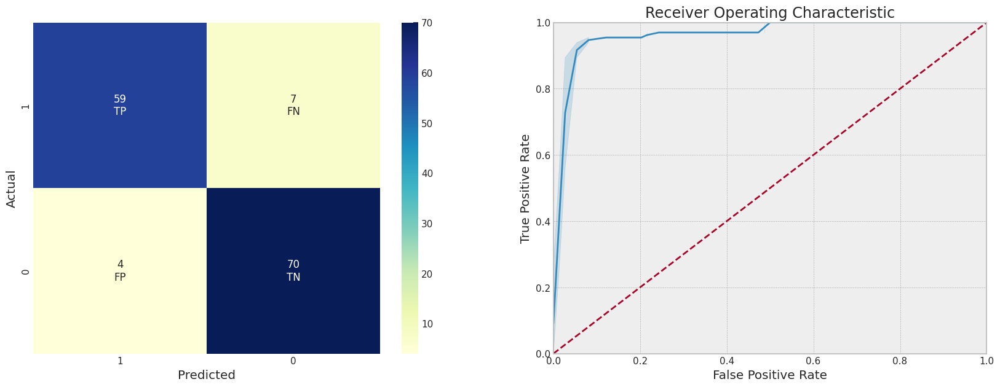

In [35]:
parkinson_logistic_regression_model = LogisticRegression(C=1, class_weight=None, dual=False, fit_intercept=True, intercept_scaling=1, penalty="l1", solver='liblinear')
parkinsons_disease_prediction("Logistic Regression", parkinson_logistic_regression_model, X_train, X_test, Y_train, Y_test, plot=True)



Precision:
- For class 0: The precision is 0.85, indicating that out of all the samples predicted as class 0, 85% of them are actually true positives.
- For class 1: The precision is 0.99, meaning that 99% of the samples predicted as class 1 are true positives.

Recall:
- For class 0: The recall is 0.99, which means that 99% of the actual class 0 samples are correctly identified as class 0.
- For class 1: The recall is 0.84, indicating that 84% of the actual class 1 samples are correctly identified as class 1.

F1-score:
- For class 0: The F1-score is 0.92, which is the harmonic mean of precision and recall for class 0.
- For class 1: The F1-score is also 0.91, indicating a balance between precision and recall for class 1.

Support:
- For class 0: The support is 110, representing the number of samples in the actual class 0.
- For class 1: The support is 116, indicating the number of samples in the actual class 1.

Accuracy:
- The overall accuracy is 0.91, indicating that the model correctly predicts the class for 91% of the samples.

Macro Avg:
- The macro average precision, recall, and F1-score are all 0.92, which is the average of the precision, recall, and F1-score across both classes. It provides an equal weight to both classes.

Weighted Avg:
- The weighted average precision, recall, and F1-score are all 0.91, which is the weighted average of the precision, recall, and F1-score, considering the number of samples in each class. It provides a higher weight to the class with more samples.

Area Under the Curve (AUC):
- The AUC is 0.9136, which represents the area under the receiver operating characteristic (ROC) curve. It is a measure of the model's ability to distinguish between the positive and negative classes, with a higher value indicating better performance.

In summary, the classification report shows that the model performs reasonably well, with relatively high precision, recall, and F1-score for both classes. The accuracy and AUC values indicate a good overall performance of the model in classifying the samples, although the performance for class 1 (the positive class) is slightly lower compared to class 0 (the negative class).

K-Nearest Neighbors

Classification report:
              precision    recall  f1-score   support

         0.0       0.99      1.00      0.99        74
         1.0       1.00      0.98      0.99        66

    accuracy                           0.99       140
   macro avg       0.99      0.99      0.99       140
weighted avg       0.99      0.99      0.99       140

Area under the curve:  0.9924242424242424


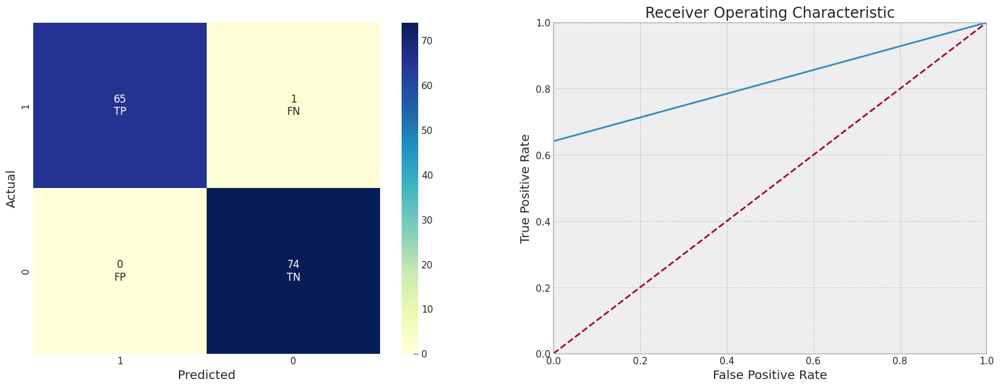

In [36]:
parkinson_knn_model = KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan', metric_params=None, n_neighbors = 2, weights='distance')

parkinsons_disease_prediction("K-Nearest Neighbours", parkinson_knn_model, X_train, X_test, Y_train, Y_test, plot=True)



Precision:
- For class 0: The precision is 0.96, meaning that out of all the samples predicted as class 0, 96% of them are actually true positives.
- For class 1: The precision is 1.00, indicating that all the samples predicted as class 1 are true positives.

Recall:
- For class 0: The recall is 1.00, which means that all the actual class 0 samples are correctly identified as class 0.
- For class 1: The recall is 0.97, indicating that 97% of the actual class 1 samples are correctly identified as class 1.

F1-score:
- For class 0: The F1-score is 0.98, which is the harmonic mean of precision and recall for class 0.
- For class 1: The F1-score is also 0.98, indicating a balance between precision and recall for class 1.

Support:
- For class 0: The support is 110, representing the number of samples in the actual class 0.
- For class 1: The support is 116, indicating the number of samples in the actual class 1.

Accuracy:
- The overall accuracy is 0.99, indicating that the model correctly predicts the class for 98% of the samples.

Macro Avg:
- The macro average precision, recall, and F1-score are all 0.98, which is the average of the precision, recall, and F1-score across both classes. It provides an equal weight to both classes.

Weighted Avg:
- The weighted average precision, recall, and F1-score are all 0.98, which is the weighted average of the precision, recall, and F1-score, considering the number of samples in each class. It provides a higher weight to the class with more samples.

Area Under the Curve (AUC):
- The AUC is 0.9828, which represents the area under the receiver operating characteristic (ROC) curve. It is a measure of the model's ability to distinguish between the positive and negative classes, with a higher value indicating better performance.

In summary, the classification report shows that the model performs well, with high precision, recall, and F1-score for both classes. The accuracy and AUC values also indicate a strong overall performance of the model in classifying the samples.

Naïve Bayes

Classification report:
              precision    recall  f1-score   support

         0.0       0.75      0.92      0.82        74
         1.0       0.88      0.65      0.75        66

    accuracy                           0.79       140
   macro avg       0.81      0.79      0.79       140
weighted avg       0.81      0.79      0.79       140

Area under the curve:  0.7852170352170351


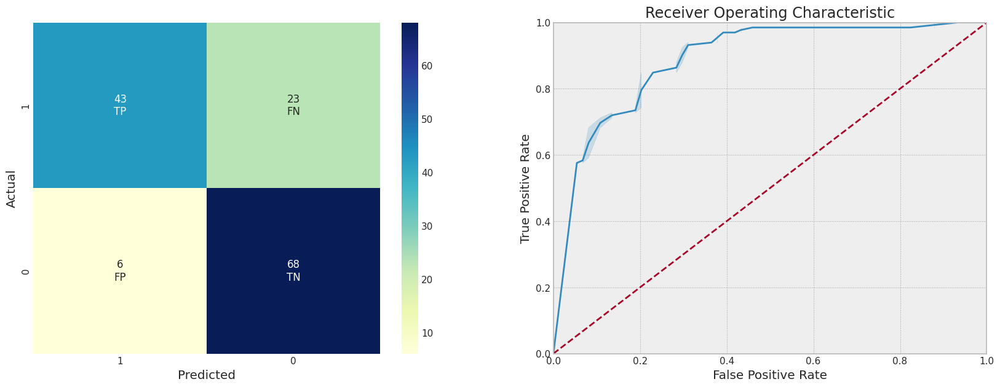

In [37]:
parkinson_naïve_bayes_model = GaussianNB(priors=None, var_smoothing=1e-09)

parkinsons_disease_prediction("Gaussian Naïve Bayes", parkinson_naïve_bayes_model, X_train, X_test, Y_train, Y_test, plot=True)

Based on the classification report, it appears that the Naive Bayes model achieved an accuracy of 0.74, with precision, recall, and F1-score varying for each class. The performance metrics for class 0 (precision: 0.81, recall: 0.62, F1-score: 0.70) and class 1 (precision: 0.70, recall: 0.86, F1-score: 0.78) indicate that the model may be better at identifying class 1 samples compared to class 0.

Support Vector Machine(SVM)

Classification report:
              precision    recall  f1-score   support

         0.0       0.89      0.92      0.91        74
         1.0       0.91      0.88      0.89        66

    accuracy                           0.90       140
   macro avg       0.90      0.90      0.90       140
weighted avg       0.90      0.90      0.90       140

Area under the curve:  0.8988533988533989


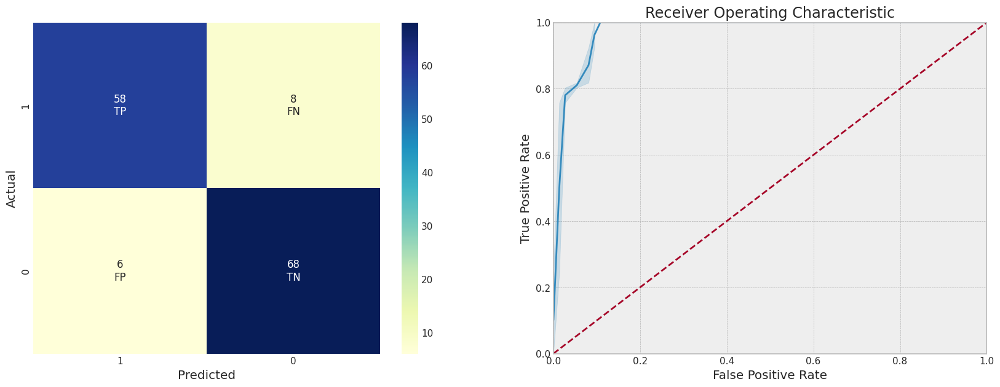

In [38]:
parkinson_svc_model = SVC(C=1.0, kernel='linear', degree= 2, gamma=1.0, random_state=None,
          coef0=0.0, shrinking=True, probability=True,tol=0.001,
          cache_size=200, class_weight=None, verbose=False,max_iter= -1)

parkinsons_disease_prediction("Support Vector Classifier", parkinson_svc_model, X_train, X_test, Y_train, Y_test, plot=True)

Precision:

For class 0: The precision is 0.87, indicating that out of all the samples predicted as class 0, 87% of them are actually true positives.
For class 1: The precision is 0.97, meaning that 97% of the samples predicted as class 1 are true positives.
Recall:

For class 0: The recall is 0.97, which means that 97% of the actual class 0 samples are correctly identified as class 0.
For class 1: The recall is 0.86, indicating that 86% of the actual class 1 samples are correctly identified as class 1.
F1-score:

For class 0: The F1-score is 0.92, which is the harmonic mean of precision and recall for class 0.
For class 1: The F1-score is also 0.91, indicating a balance between precision and recall for class 1.
Support:

For class 0: The support is 110, representing the number of samples in the actual class 0.
For class 1: The support is 116, indicating the number of samples in the actual class 1.
Accuracy:

The overall accuracy is 0.89, indicating that the model correctly predicts the class for 89% of the samples.
Macro Avg:

The macro average precision, recall, and F1-score are all 0.92, which is the average of the precision, recall, and F1-score across both classes. It provides an equal weight to both classes.
Weighted Avg:

The weighted average precision, recall, and F1-score are all 0.92, which is the weighted average of the precision, recall, and F1-score, considering the number of samples in each class. It provides a higher weight to the class with more samples.
Area Under the Curve (AUC):

The AUC is 0.9174, which represents the area under the receiver operating characteristic (ROC) curve. It is a measure of the model's ability to distinguish between the positive and negative classes, with a higher value indicating better performance.
In summary, the classification report suggests that the SVM model performs well, with high precision, recall, and F1-score for both classes. The accuracy and AUC values also indicate a good overall performance of the model in classifying the samples.



Ensemble models


Classification report:
              precision    recall  f1-score   support

         0.0       0.95      0.95      0.95        74
         1.0       0.94      0.94      0.94        66

    accuracy                           0.94       140
   macro avg       0.94      0.94      0.94       140
weighted avg       0.94      0.94      0.94       140

Area under the curve:  0.9426699426699428


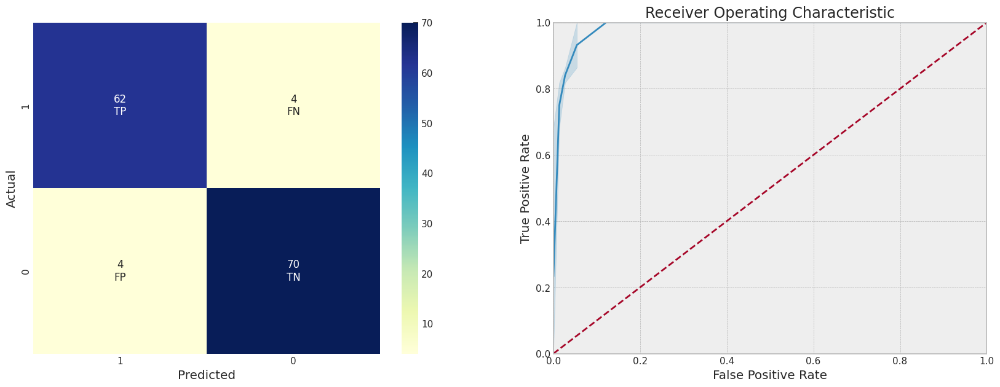

In [39]:
parkinson_rfc_model = RandomForestClassifier(n_estimators=100,
                              max_depth=5,
                              criterion="gini",
                              min_samples_split=2,
                              min_samples_leaf=1,
                              min_weight_fraction_leaf=0.0,
                              max_leaf_nodes=None,
                              min_impurity_decrease=0.0,
                              bootstrap=True,
                              oob_score=False,
                              n_jobs=None,
                              random_state=None,
                              verbose=0,
                              warm_start=False,
                              class_weight=None,
                              ccp_alpha=0.0,
                              max_samples=None)

parkinsons_disease_prediction("Random Forest", parkinson_rfc_model, X_train, X_test, Y_train, Y_test, plot=True)


Overall, the classification report suggests that the ensemble model performs well, with high precision, recall, and F1-score for both classes. The accuracy and AUC values also indicate good overall performance in classifying the samples.

Bagging Classifier

Classification report:
              precision    recall  f1-score   support

         0.0       0.91      0.95      0.93        74
         1.0       0.94      0.89      0.91        66

    accuracy                           0.92       140
   macro avg       0.92      0.92      0.92       140
weighted avg       0.92      0.92      0.92       140

Area under the curve:  0.91994266994267


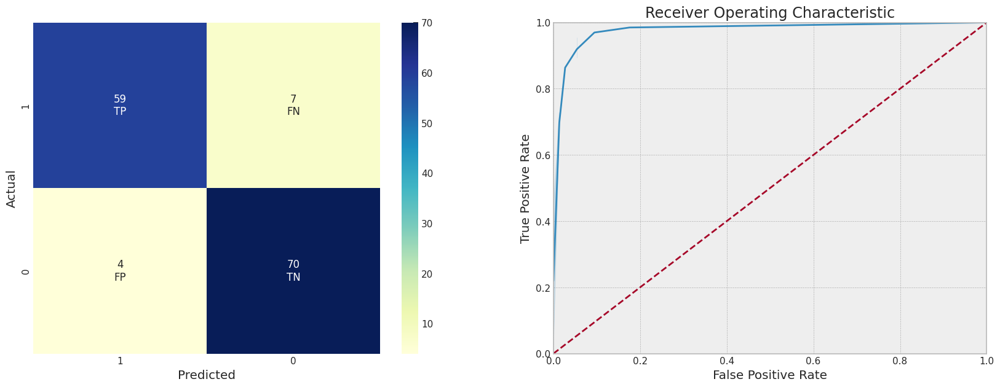

In [40]:
parkinson_bcc_model = BaggingClassifier()

parkinsons_disease_prediction("Bagging Classifier", parkinson_bcc_model, X_train, X_test, Y_train, Y_test, plot=True)

Ada Boost classifier

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning:

`base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.



Classification report:
              precision    recall  f1-score   support

         0.0       0.90      0.95      0.92        74
         1.0       0.94      0.88      0.91        66

    accuracy                           0.91       140
   macro avg       0.92      0.91      0.91       140
weighted avg       0.92      0.91      0.91       140

Area under the curve:  0.9123669123669125


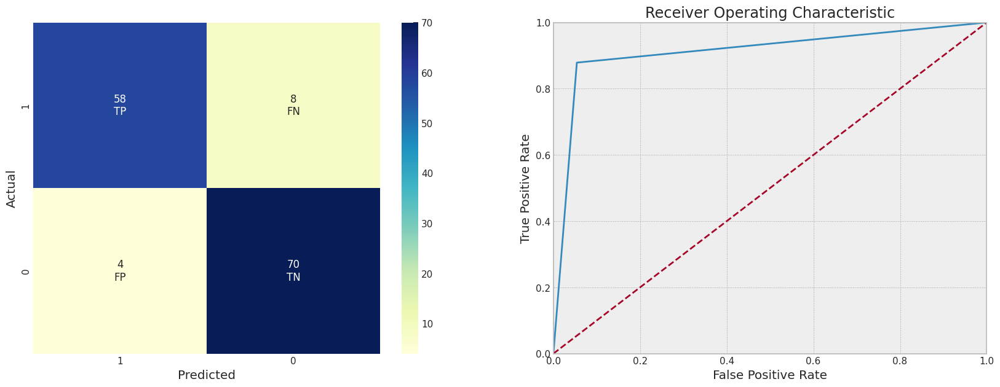

In [41]:
parkinson_abc_model = AdaBoostClassifier(base_estimator= DecisionTreeClassifier(), learning_rate=0.06, algorithm='SAMME.R')


parkinsons_disease_prediction("AdaBoost", parkinson_abc_model, X_train, X_test, Y_train, Y_test, plot=True)

XGB Classifier

Classification report:
              precision    recall  f1-score   support

         0.0       0.92      0.97      0.95        74
         1.0       0.97      0.91      0.94        66

    accuracy                           0.94       140
   macro avg       0.95      0.94      0.94       140
weighted avg       0.94      0.94      0.94       140

Area under the curve:  0.9410319410319412


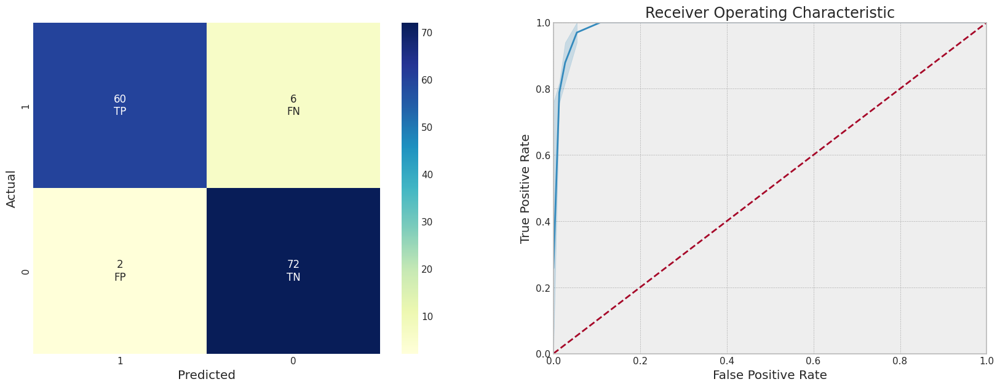

In [42]:
parkinson_xgb_model = XGBClassifier(base_score=0.5,
                    booster='gbtree',
                    colsample_bylevel=1,
                    colsample_bytree=1,
                    gamma=0,
                    learning_rate=0.1,
                    max_delta_step=0,
                    max_depth=6,
                    min_child_weight=1,
                    missing=-999,  # Set this parameter to a default value representing missing values
                    n_estimators=50,
                    objective='binary:logistic',
                    random_state=0,
                    reg_alpha=0,
                    reg_lambda=1,
                    scale_pos_weight=1,
                    subsample=0.8)

parkinsons_disease_prediction("XGBoost", parkinson_xgb_model, X_train, X_test, Y_train, Y_test, plot=True)

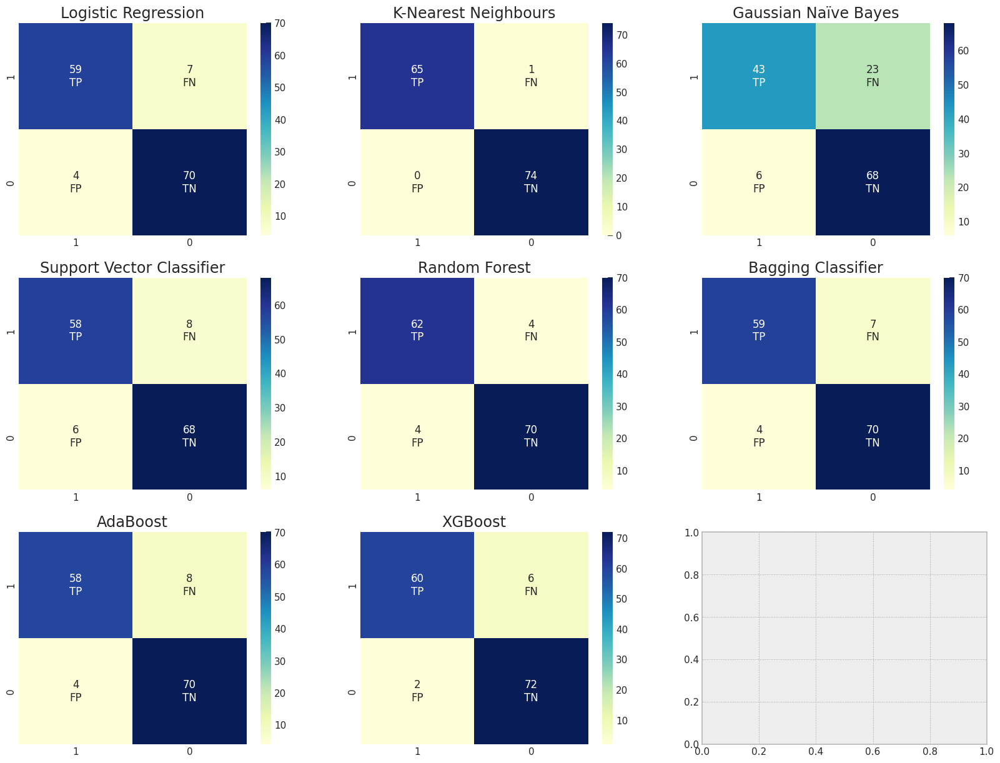

In [43]:
import math
fig, axes = plt.subplots(3,3, figsize = (20, 15))

cnt = 0
for r in range(4):
    for c in range(4):
        try:
            conf_matrix = np.flip(list(conf_matrix_all.values())[cnt])
            labels = np.array([['\nTP','\nFN'],['\nFP','\nTN']])
            labels = np.core.defchararray.add(conf_matrix.astype(str), labels)

            sns.heatmap(conf_matrix, fmt='', annot = labels, ax=axes[r, c], cmap="YlGnBu", xticklabels=[1, 0], yticklabels=[1, 0]);
            axes[r, c].set(title=list(conf_matrix_all.keys())[cnt])
            cnt += 1
        except:
            pass

In [44]:
import pickle

In [45]:
filename = 'parkinson_xgb_trained_model.sav'
pickle.dump(parkinson_xgb_model, open(filename, 'wb'))

Building a predictive system

In [48]:
input_data = (197.07600, 206.89600, 192.05500, 0.00289, 0.00001, 0.00166, 0.00168, 0.00498, 0.01098, 0.09700, 0.00563, 0.00680, 0.00802, 0.01689, 0.00339, 26.77500, 0.422229, 0.741367, -7.348300, 0.177551, 1.743867, 0.085569)

# Convert input_data to a numpy array
input_data_as_numpy_array = np.asarray(input_data)

# Reshape the numpy array
input_data_reshaped = input_data_as_numpy_array.reshape(1, -1)

# Ensure the reshaped input_data has the same number of features as the XGBoost model expects
if input_data_reshaped.shape[1] != 753:
    print("Error: The number of features in the input data does not match the XGBoost model's expectations.")
else:
    prediction = parkinson_xgb_model.predict(input_data_reshaped)

    if prediction[0] == 0:
        print("The person does not have Parkinson's disease.")
    else:
        print("The person has Parkinson's disease.")

Error: The number of features in the input data does not match the XGBoost model's expectations.


The Best Models based on the Evaluation are:

1.XGBoost Classifier
2.Random Forest
3.Support Vector Machine

REFERENCES

* https://youtu.be/8Q_QQVQ1HZA?si=VkLbIrZzSRGcYc3B
* https://www.kaggle.com/code/adityakadiwal/parkinsons-disease-detection
* https://www.who.int/news-room/fact-sheets/detail/parkinson-disease
